In [2]:
import time, os.path
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb
from skimage.exposure import adjust_gamma
from skimage.filters import unsharp_mask
import torch
from torch import nn, optim
from torchvision.transforms import v2
from torch.utils.data import Dataset, DataLoader
import pandas as pd

Based on https://towardsdatascience.com/colorizing-black-white-images-with-u-net-and-conditional-gan-a-tutorial-81b2df111cd8

In [3]:
%matplotlib inline 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DEBUG = True

# Preprocessing

## Obtaining data: 

### Datasources
- Aerial photo's (Open data, from the Goverment or NGI):
    - Panchromatic: https://www.vlaanderen.be/datavindplaats/catalogus/orthofotos-middenschalig-zwart-wit-opname-1997-2000
    - Panchromatic: https://www.vlaanderen.be/datavindplaats/catalogus/orthofotomozaiek-kleinschalig-zomeropnamen-0 
    - RGB-colored: https://www.vlaanderen.be/datavindplaats/catalogus/orthofotowerkbestand-202303
    - ...
- Landuse: https://www.vlaanderen.be/datavindplaats/catalogus/bodembedekkingskaart-bbk-1m-resolutie-opname-2018 

### Tiling the sourcedata from JPEG2000 to Jpeg

Pytorch can't read jpeg2000 and the files are to large. 

GDAL has a fast tool to https://gdal.org/programs/gdal_retile.html this tool preserves the geographical properties and metadata in a csv-file, and allows also to write some overlap, this is nessary if you gonne apply convoltions on the data. Files with only nodata are ommitted. 

For each jpeg2000 write a collection of tiles and index csv-file that describes these files.
For example for the files of 2023, in powershell: 
```ps1
foreach ($G in ls W:\2023\*.jp2 ){ 
    gdal_retile -co WORLDFILE=YES -overlap 100 -ps 512 512 -csv "W:\\2023_tiles\\$($G.Basename).csv" -f JPEG -ot Byte -targetDir "W:\\2023_tiles" $G.fullname
}
```

For the 0.15 meter resolution photo's of 2023 this give us 2626657 files.  

## The making of a weigthed dataset

We wil use the Flemish landuse dataset 'Bodem Bedekkings Kaart (BBK)" from the Flemish Goverment:  
https://www.vlaanderen.be/datavindplaats/catalogus/bodembedekkingskaart-bbk-1m-resolutie-opname-2018

The BBK is a Segmentation map derived from the Multispectral (RGB-NIR) aerial images that shows the land cover in Flanders. Based on pixel classification supplemented with vectorial ground truth data, data is divided into low green, agricultural, forest, waterway and buildings. The target audience of these maps at resolution 1m and 5m is the general user who wants to consult a land cover map of Flanders as a basis for various analyzes relating to land cover or land use.

This map has 14 broad catergories + 0 for no data or unknown: 

1) Buildings
2) Roads
3) Other constructed
4) Railroads
5) Water
6) Other Natural
7) Field (Agriculture)
8) Grass Bushes (Nature)
9)  Trees (Nature)
10) Grass Bushes (Agriculture)
11) Grass Bushes (Road Edge)
12) Trees (Road edge)
13) Grass Bushes (Water Edge)
14) Trees (Water Edge)

<img src="pic/BBK18.png" 
alt="A colored image of the BBK" 
title="A colored image of the BBK" width="350" height="auto">

We sample for the extend of every photo for the dominant Category. We use the tool Zonal statistics is QGIS for this: https://docs.qgis.org/3.34/en/docs/user_manual/processing_algs/qgis/rasteranalysis.html#qgiszonalstatisticsfb

This domminant factor is a weigthed median, weigthed by the prevalace of the pixelvalue in the whole map. 

The result is saved to arrow-file. 

Below you you see this file on of the traindata yellow for agriculture types, green for natural types, blue for water and reds for constructed types.

<img src="pic/BBK18_reclass.png" 
alt="A colored image of the BBK" 
title="A colored image of the BBK" width="480" height="auto">

In [7]:
BBK_CATEGORIES = {
    0: "Onbekend",
    1: "Gebouwen",
    2: "Autowegen",
    3: "Overig Afgedekt",
    4: "Spoorwegen",
    5: "Water",
    6: "Overig Onafgedekt",
    7: "Akker (Landbouw)",
    8: "Gras  Struiken (Groen)",
    9: "Bomen (Groen)",
    10: "Gras  Struiken (Landbouw)",
    11: "Gras  Struiken (Wegrand)" ,
    12: "Bomen (Wegrand)" ,
    13: "Gras  Struiken (Waterrand)",
    14: "Bomen (Waterrand)"}

grouped_categories=  {"CONSTRUCT": [1,2,3,4],  "GREEN": [6,8,10,11], 
                      "AGRO": [7], "WOOD": [9,12], "WATER":[5,13,14], 
                      "NONE": [0]}

In [8]:
ds = pd.read_feather(r"W:\2023_tiles\2023tiles_landuse.arrow")
#group this to a few simpler categories
ds["CATEGORY"] = ds["BBK_CAT"].map({v: k for k,vv in grouped_categories.items() for v in vv})
ds["CATEGORY"] = ds["CATEGORY"].astype("category")
ds["BBK_CAT"] = ds["BBK_CAT"].astype("category")
ds["BBK_CAT"]= ds["BBK_CAT"].cat.rename_categories(BBK_CATEGORIES.values())
ds[["NAME", "BBK_CAT","CATEGORY"]].sample(3)

,NAME,BBK_CAT,CATEGORY
1987720,K297z/OMWRGBMRVL_K297z_06_98.jpg,Akker (Landbouw),AGRO
758135,K156z/OMWRGBMRVL_K156z_48_93.jpg,Gras Struiken (Landbouw),GREEN
2494611,K361n/OMWRGBMRVL_K361n_31_20.jpg,Onbekend,NONE


Also check and remove files that don't exist or are mostly black (=nodata)
this removes a larger portion most of the NONE values in CATEGORY, 
except for tiles in Brussels that is ommited from BBK, but not from the images of the 2023 trainingdata. 

In [9]:
ds = ds[ds["NAME"].apply(lambda x: os.path.exists(f'W:\\2023_tiles\\{x}') and
                                   np.median( plt.imread(f'W:\\2023_tiles\\{x}') )!= 0 ) ]
ds.reset_index(inplace=True)

Calulate the percentage of occurrences of a CATEGORY

Text(0, 0.5, '%')

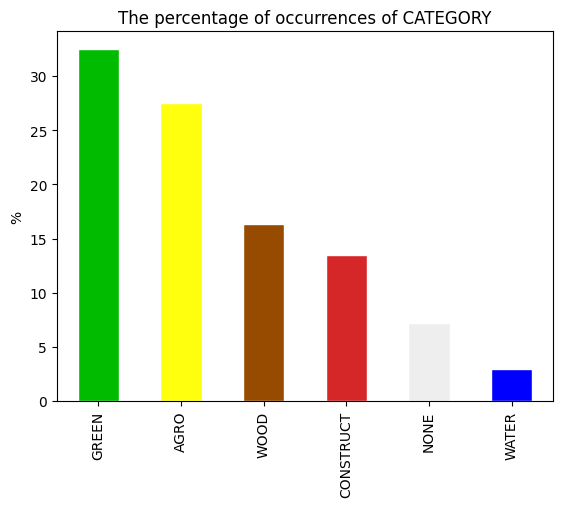

In [57]:
ax = (100* ds.CATEGORY.value_counts() / ds.CATEGORY.count()).plot.bar(edgecolor='#fff',
    color =['#0b0', '#ffff0e', '#964B00', '#d62728', '#eee','#00f'])

ax.set_title('The percentage of occurrences of CATEGORY')
ax.set_xlabel(None)
ax.set_ylabel('%')

We can use these inverse value counts as weigths on these tiles. So the less a values common a value, the more likely it will be picked in weigthed sampling.   

In [23]:
weigths = 1/ds["CATEGORY"].value_counts()
ds['WEIGHT'] = ds['CATEGORY'].map( weigths ) 
# you can use this field to sample this dataset in balaced manner, 
# replace is False so a photo won't be picked twice. 
ds.sample(5,  weights='WEIGHT', replace=False)[['NAME',"BBK_CAT","CATEGORY","WEIGHT"]]

,NAME,BBK_CAT,CATEGORY,WEIGHT
1048499,K212z/OMWRGBMRVL_K212z_22_18.jpg,Gras Struiken (Wegrand),GREEN,0.000001
1464320,K254z/OMWRGBMRVL_K254z_06_39.jpg,Gebouwen,CONSTRUCT,0.000003
165995,K084n/OMWRGBMRVL_K084n_08_22.jpg,Onbekend,NONE,0.000006
642445,K161n/OMWRGBMRVL_K161n_11_33.jpg,Gras Struiken (Groen),GREEN,0.000001
1571484,K266n/OMWRGBMRVL_K266n_37_26.jpg,Bomen (Groen),WOOD,0.000003


Save the results back to an arrow file. 

In [8]:
ds.to_feather('./data/tiles_2023_Weighted.arrow', compression='lz4')

#  DATASET

In [9]:
def makeWeightedDataFromArrow(arrow, train_size=4000, test_size=1000,
                              pathField='NAME', weigthField='WEIGHT', replacement=False):
    ds= pd.read_feather(arrow)
    train_paths = ds.sample(train_size, weights=weigthField, replace=replacement)[pathField]
    test_paths = ds.sample(test_size, weights=weigthField, replace=replacement)[pathField]
    return list(train_paths), list(test_paths)


In [10]:
train_paths, val_paths = makeWeightedDataFromArrow(
    r'.\data\tiles_2023_Weighted.arrow', train_size=100, test_size=20, 
    pathField='NAME', weigthField='WEIGHT', replacement=False)
print(len(train_paths), len(val_paths))

100 20


Text(0.5, 1.0, 'Random augmentation')

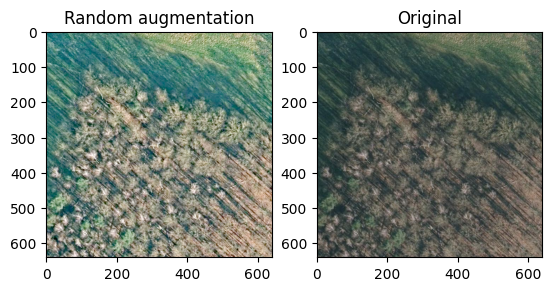

In [11]:
# Load your image using PIL
image = Image.open( Path(r'W:\2023_tiles') / train_paths[ np.random.randint(0,100+1) ]) 
SIZE = 256
def aug(img):
        return adjust_gamma( gamma= np.random.uniform(low=0.5, high=2), 
               image= unsharp_mask(image=img, radius=np.random.randint(0,15) ))
# Apply the transformation to your image
aug_image = aug(np.array(image))

fig,axs= plt.subplots(1,2)
axs[1].imshow(image)
axs[1].set_title('Original')
axs[0].imshow(aug_image)
axs[0].set_title('Random augmentation')


In [ ]:
class ColorizationDataset(Dataset):
    def __init__(self, paths, imsize=256, rootDir=''):
        super(ColorizationDataset).__init__()
        self.size = imsize
        self.paths = paths
        self.root = rootDir

    def aug(self, img):
        "some simple data augmentation on img "
        return adjust_gamma( gamma= np.random.uniform(low=0.5, high=2), 
                            image= unsharp_mask(image=img, radius=np.random.randint(0,15) )  )
    
    def __getitem__(self, idx):
        img = Image.open( Path(self.root) / self.paths[idx]).convert("RGB").resize((self.size ,self.size ))
        img_lab = rgb2lab( self.aug( np.array(img) ) ) # Converting RGB to L*a*b
        img_lab = v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=False)])(img_lab)
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1
        return {'L': L, 'ab': ab}
    
    def __len__(self):
        return len(self.paths)

In [ ]:
train_dl = DataLoader(ColorizationDataset(train_paths, 
                       imsize=256, rootDir=r'W:\2023_tiles'), batch_size=32)
val_dl = DataLoader(ColorizationDataset(val_paths, 
                       imsize=256, rootDir=r'W:\2023_tiles'), batch_size=32)

In [ ]:
data = next(iter(val_dl))
Ls, abs_ = data['L'], data['ab']

print(Ls.shape, abs_.shape)
print(len(train_dl), len(val_dl))

torch.Size([20, 1, 256, 256]) torch.Size([20, 2, 256, 256])
4 1


## Generator

In [ ]:
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)
        
        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)
    
    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)
    
    def forward(self, x):
        return self.model(x)

# Discriminator

In [4]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2) 
                          for i in range(n_down)] # the 'if' statement is taking care of not using
                                                  # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                                                             # activation for the last layer of the model
        self.model = nn.Sequential(*model)                                                   
        
    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

# GAN Loss

In [5]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

# Main

In [6]:
def init_weights(net, init='norm', gain=0.02):
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')

            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)

    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model


class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1
        
        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion =  nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))
    
    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad
        
    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)
        
    def forward(self):
        # with autocast():
            self.fake_color = self.net_G(self.L)
    
    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GAN_loss(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GAN_loss(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GAN_loss(fake_preds, True)
        self.loss_G_L1 = self.L1_loss(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()
        
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()


# Train

In [14]:
class AverageMeter:
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()
    
    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """
    
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)
    
def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")
        
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

In [ ]:
def train_model(model, train_dl, epochs):
    model.train() 
    data = next(iter(val_dl)) # getting a batch for visualizing the model output after fixed intrvals
    for e in range(epochs):
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to 
                          
        for data in tqdm(train_dl):
            model.setup_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0)) # function updating the log objects

        print(f"\nEpoch {e+1}/{epochs}") 
        log_results(loss_meter_dict) # function to print out the losses
        visualize(model, data, save=False) # function displaying the model's outputs
 

In [ ]:
model = MainModel()
train_model(model, train_dl, 20)
model.eval()
with torch.inference_mode():
   torch.save(model.state_dict(), 'testRun.pth')

# Inference

In [47]:
import torch, numpy as np, matplotlib.pyplot as plt
from osgeo import gdal
gdal.UseExceptions()
from pathlib import Path
from model.mainModel import MainModel
from model.tools import lab_to_rgb

In [2]:
model_05= MainModel()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model initialized with norm initialization
model initialized with norm initialization


In [30]:
img_test = list( Path(r"W:\testdata\tiles_1950_gray").glob('*.png') )
randImg = lambda: str( img_test[ np.random.randint(0, len(img_test) ) ]) 
randImg()

'W:\\testdata\\tiles_1950_gray\\tiles_1950_gray.547.png'

In [6]:
with torch.inference_mode():
    model_05.load_state_dict(
        torch.load(r".\runs\model_pil_run10_1m_512.pth", map_location=device) )

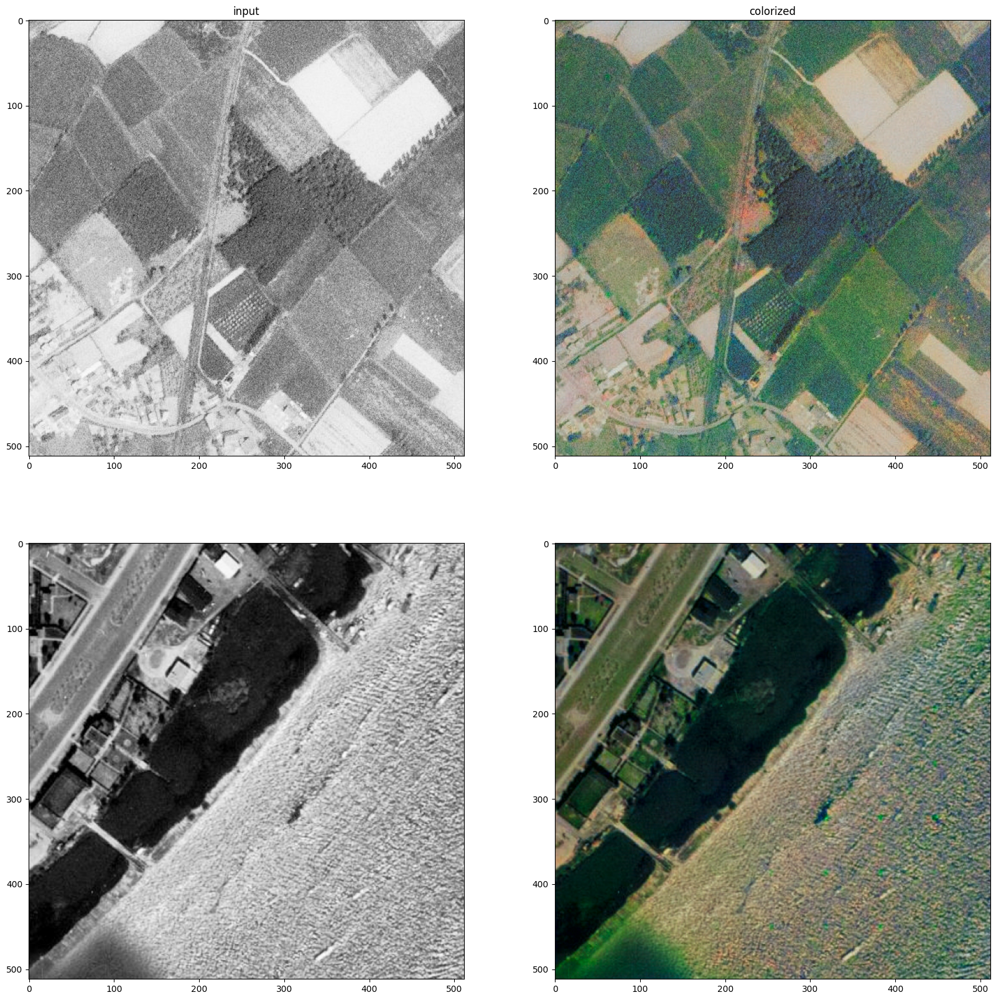

In [36]:
imsize = 512
ds0 =gdal.Open( r"W:\1970\OKZPAN71VL_K15.jp2" ) # 1970
ds1 =gdal.Open( randImg())                      # 1950

_img = ds0.GetRasterBand(1).ReadAsArray(
    xoff= np.random.randint(ds0.RasterXSize - imsize), 
    yoff= np.random.randint(ds0.RasterYSize - imsize), 
    win_xsize=imsize, win_ysize=imsize)

x_img, y_img = _img.shape[:2]
if x_img != imsize or y_img != imsize:
    _img =np.pad(_img, ((0,imsize- x_img),(0,imsize - y_img))) 

g0_img = torch.Tensor( (_img.unsqueeze(0) /128) -1 )
g1_img = torch.Tensor( ( ds1.GetRasterBand(1).ReadAsArray() /128) -1 ).unsqueeze(0)

with torch.inference_mode():
    pred0 = model_05.net_G(g0_img.unsqueeze(0).to(device) )
    pred1 = model_05.net_G(g1_img.unsqueeze(0).to(device) )
 
colorized0 = lab_to_rgb(g0_img.unsqueeze(0), pred0.cpu())[0]
colorized1 = lab_to_rgb(g1_img.unsqueeze(0), pred1.cpu())[0]

f , axs = plt.subplots(2,2)
f.set_size_inches(20,20)
axs[0,0].imshow(g0_img[0], cmap='Greys_r')
axs[0,0].set_title('input')
axs[0,1].imshow(colorized0)
axs[0,1].set_title("colorized")
axs[1,0].imshow(g1_img[0], cmap='Greys_r')
axs[1,1].imshow(colorized1)

In [ ]:
from RealESRGAN import RealESRGAN
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [41]:
model4x = RealESRGAN(device, scale=4)
model4x.load_weights('../weights/RealESRNet_x4plus.pth', download=False)

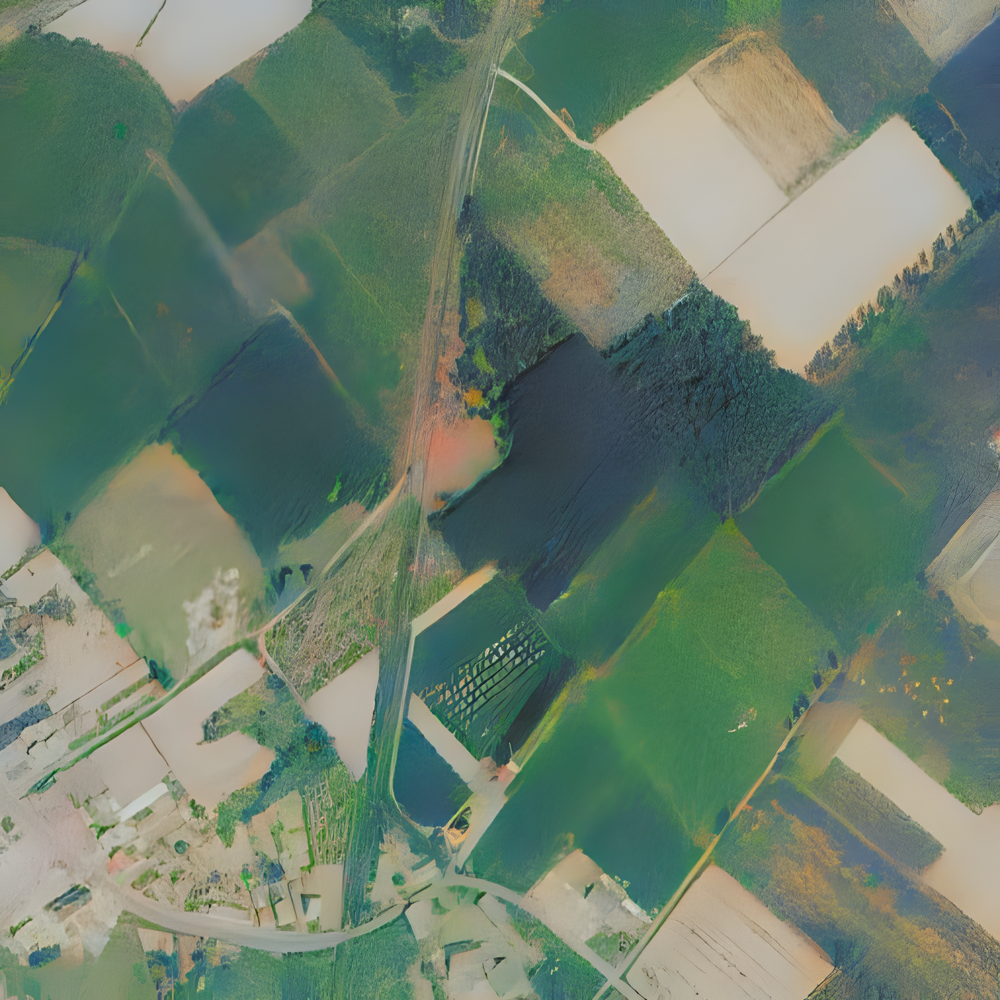

In [39]:
img = Image.fromarray((colorized0 * 255).astype(np.uint8))
sr_image = model4x.predict(img)
sr_image